### Object detection with Faster-RCNN Overview

![architect Faster RCNN using resnet50 as backbone](https://www.researchgate.net/profile/Debaditya-Acharya/publication/355576303/figure/fig8/AS:1083064709062660@1635234157666/The-architecture-of-Faster-RCNN-containing-a-ResNet50-backbone.png)

Install Kaggle API, configure it, and download and unzip the Pascal VOC 2012 dataset


In [1]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d bardiaardakanian/voc0712
!unzip voc0712.zip

Streaming output truncated to the last 5000 lines.
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001874.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001876.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001882.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001885.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001895.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001896.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001926.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001966.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001971.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001992.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_001997.png  
  inflating: VOC_dataset/VOCdevkit/VOC2012/SegmentationClass/2008_002032.png  
 

### Import necessary libraries and set random seeds for reproducibility

In [2]:
import os
import xml.etree.ElementTree as ET
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision

from sklearn import preprocessing

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data import SequentialSampler

torch.manual_seed(2002)
np.random.seed(2002)
random.seed(2002)

import time
from tqdm.auto import tqdm
import warnings

warnings.filterwarnings('ignore')

Helper function to draw bounding boxes on images, read images, and plot single or multiple images with titles

In [3]:
def draw_rectangle(img, bboxes,names, color = (255,0,0)):
    """
    Draws rectangles around detected objects and adds labels.

    Args:
        img (np.array): Image in which to draw rectangles.
        bboxes (list): List of bounding boxes.
        names (list): List of names corresponding to bounding boxes.
        color (tuple): Color of the rectangle. Default is red.

    Returns:
        np.array: Image with rectangles and labels.
    """
    img = img.copy()
    for bbox,name in zip(bboxes,names):
        bbox = np.array(bbox).astype(int)
        pt1, pt2 = (bbox[0], bbox[1]), (bbox[2], bbox[3])
        img = cv2.rectangle(img, pt1, pt2 , color, int(max(img.shape[:2]) / 200))
        img = cv2.putText(img, name, (pt1[0],pt1[1]+15),
                          cv2.FONT_HERSHEY_COMPLEX ,0.5,(0,220,0),1,cv2.LINE_AA)
    return img

# Function to read and convert image to RGB
def read_img(path):
    """
    Reads an image from a given path and converts it to RGB.

    Args:
        path (str): Path to the image file.

    Returns:
        np.array: Image in RGB format.
    """
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to display an image with bounding boxes and labels
def plot_img(path, bboxes,names):
    """
    Plots an image with bounding boxes and labels.

    Args:
        path (str): Path to the image file.
        bboxes (list): List of bounding boxes.
        names (list): List of names corresponding to bounding boxes.
    """
    img = read_img(path)
    img = draw_rectangle(img, bboxes, names)
    plt.imshow(img)

    plt.grid(False)
    plt.xticks([])
    plt.yticks([]);

# Function to plot multiple images in a grid format
def plot_multiple_img(img_matrix_list, title_list, ncols, nrows=3, main_title=""):
    """
    Plots multiple images in a grid format.

    Args:
        img_matrix_list (list): List of images.
        title_list (list): List of titles for the images.
        ncols (int): Number of columns in the grid.
        nrows (int): Number of rows in the grid. Default is 3.
        main_title (str): Main title for the plot. Default is empty.
    """
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=nrows, ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 30)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):

        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=15)
        myaxes[i // ncols][i % ncols].grid(False)
        myaxes[i // ncols][i % ncols].set_xticks([])
        myaxes[i // ncols][i % ncols].set_yticks([])

    plt.show()

Define paths for images and annotations

In [4]:
IMG_PATH = '/content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages'
XML_PATH = '/content/VOC_dataset/VOCdevkit/VOC2012/Annotations'

# Check if paths exist and list contents
if os.path.exists(XML_PATH):
    print("Contents of Annotations directory:", os.listdir(XML_PATH))
    XML_FILES = [os.path.join(XML_PATH, file) for file in os.listdir(XML_PATH)]
    print("XML files loaded successfully")
else:
    print(f"Error: Directory {XML_PATH} does not exist")

Contents of Annotations directory: ['2011_005178.xml', '2009_002523.xml', '2011_002053.xml', '2012_000983.xml', '2011_004457.xml', '2008_004410.xml', '2011_002884.xml', '2008_008122.xml', '2011_005711.xml', '2009_004587.xml', '2012_001780.xml', '2011_006296.xml', '2011_003577.xml', '2010_005119.xml', '2011_006853.xml', '2010_005891.xml', '2008_007182.xml', '2011_005867.xml', '2011_003352.xml', '2011_007185.xml', '2007_007470.xml', '2008_003252.xml', '2011_005977.xml', '2011_005439.xml', '2008_000457.xml', '2009_003457.xml', '2010_006838.xml', '2011_005161.xml', '2011_003907.xml', '2012_003701.xml', '2012_003002.xml', '2011_006029.xml', '2008_008346.xml', '2011_006014.xml', '2010_006172.xml', '2007_000123.xml', '2008_001778.xml', '2012_001654.xml', '2011_000514.xml', '2008_007990.xml', '2011_000219.xml', '2010_005211.xml', '2008_002720.xml', '2009_003032.xml', '2012_002388.xml', '2007_003571.xml', '2011_002251.xml', '2012_002529.xml', '2007_000464.xml', '2010_005111.xml', '2008_000775.x

Mount Google Drive to access files stored there

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Define a class to parse XML annotations and manage image paths, object names, and bounding boxes


In [6]:
# Class to parse Pascal VOC XML annotations and extract object names and bounding boxes
class Anno_xml():
    def __init__(self, xml_file):
        """
        Initializes the Anno_xml class with the XML file path.

        Args:
            xml_file (str): Path to the XML file.
        """
        self.xml_file = xml_file

        self._root = ET.parse(self.xml_file).getroot()

        self._object = self._root.findall('object')

        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)

        self.image_id = self._root.find("filename").text

        self.names = self._get_name()

        self.boxes = self._get_bndbox()

    def _get_name(self):
        """
        Returns a list of object names from the XML annotations.

        Returns:
            list: List of object names.
        """
        names = []
        for obj in self._object:
            name = obj.find('name').text
            names.append(name)
        return np.array(names)

    def _get_bndbox(self):
        """
        Returns a list of bounding boxes from the XML annotations.

        Returns:
            list: List of bounding boxes.
        """
        boxes = []
        for obj in self._object:
            coordinates = []
            bndbox = obj.find('bndbox')
            coordinates.append(np.float32(bndbox.find("xmin").text) - 1)
            coordinates.append(np.float32(bndbox.find("ymin").text) - 1)
            coordinates.append(np.float32(bndbox.find("xmax").text) - 1)
            coordinates.append(np.float32(bndbox.find("ymax").text) - 1)
            boxes.append(coordinates)

        return np.array(boxes)

Convert a list of XML files into a pandas DataFrame containing image IDs, object names, bounding boxes, XML paths, and image paths

In [7]:
def xml_files_to_df(xml_files):
    """
    Return a pandas DataFrame from a list of XML files.

    Args:
        xml_files (list): List of paths to XML annotation files.

    Returns:
        pd.DataFrame: DataFrame containing image IDs, object names, bounding boxes, XML paths, and image paths.
    """
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = Anno_xml(file)
        names.extend(xml.names)
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}

    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()

    return df

df = xml_files_to_df(XML_FILES)
df.head()

,image_id,names,boxes,xml_path,img_path
0,2011_005178.jpg,person,"[12.0, 91.0, 160.0, 374.0]",/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...
1,2011_005178.jpg,person,"[108.0, 63.0, 250.0, 374.0]",/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...
2,2011_005178.jpg,person,"[335.0, 39.0, 457.0, 374.0]",/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...
3,2011_005178.jpg,person,"[245.0, 54.0, 342.0, 374.0]",/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...
4,2009_002523.jpg,chair,"[317.0, 216.0, 450.0, 365.0]",/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...


Expand bounding box coordinates into separate columns and clean 'image_id' by removing '.jpg' extension


In [8]:
# Expand 'boxes' column into separate columns for xmin, ymin, xmax, ymax, and remove '.jpg' extension from 'image_id'
df[['xmin','ymin','xmax','ymax']] = np.stack(list(df['boxes']))
df.drop('boxes', axis=1, inplace=True)

# Remove '.jpg' extension from 'image_id'
df['image_id'] = df['image_id'].apply(lambda x: x.split('.')[0])

# Display the DataFrame to verify the changes
print(df.head())


      image_id   names                                           xml_path  \
0  2011_005178  person  /content/VOC_dataset/VOCdevkit/VOC2012/Annotat...   
1  2011_005178  person  /content/VOC_dataset/VOCdevkit/VOC2012/Annotat...   
2  2011_005178  person  /content/VOC_dataset/VOCdevkit/VOC2012/Annotat...   
3  2011_005178  person  /content/VOC_dataset/VOCdevkit/VOC2012/Annotat...   
4  2009_002523   chair  /content/VOC_dataset/VOCdevkit/VOC2012/Annotat...   

                                            img_path   xmin   ymin   xmax  \
0  /content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...   12.0   91.0  160.0   
1  /content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...  108.0   63.0  250.0   
2  /content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...  335.0   39.0  457.0   
3  /content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...  245.0   54.0  342.0   
4  /content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...  317.0  216.0  450.0   

    ymax  
0  374.0  
1  374.0  
2  374.0  
3  374.0  
4  365.0  


Check the distribution of object classes in the DataFrame


In [9]:
df['names'].value_counts()

names
person         24727
chair           3058
car             2492
dog             1598
bottle          1561
cat             1277
bird            1271
pottedplant     1202
sheep           1084
boat            1059
aeroplane       1002
tvmonitor        893
sofa             841
bicycle          837
horse            803
diningtable      802
motorbike        801
cow              771
train            704
bus              685
Name: count, dtype: int64

Encode object names into numerical labels for model training

In [10]:
encode = preprocessing.LabelEncoder()
df['labels'] = encode.fit_transform(df['names']) + 1

Display the count of each class name and its corresponding encoded label


In [11]:
df[['names','labels']].value_counts()

names        labels
person       15        24727
chair        9          3058
car          7          2492
dog          12         1598
bottle       5          1561
cat          8          1277
bird         3          1271
pottedplant  16         1202
sheep        17         1084
boat         4          1059
aeroplane    1          1002
tvmonitor    20          893
sofa         18          841
bicycle      2           837
horse        13          803
diningtable  11          802
motorbike    14          801
cow          10          771
train        19          704
bus          6           685
Name: count, dtype: int64

Define a dictionary mapping class labels to class names for 20 object categories


In [12]:
#20 classes
classes= {1:'aeroplane',2:'bicycle',3:'bird',4:'boat',5:'bottle',6:'bus',7:'car',
          8:'cat',9:'chair',10:'cow',11:'diningtable',12:'dog',13:'horse',
          14:'motorbike',15:'person',16:'pottedplant',17:'sheep',18:'sofa',
          19:'train',20:'tvmonitor'}

Remove the 'names' column from the DataFrame

In [13]:
df.drop(columns=['names'], inplace=True)
df.head()

,image_id,xml_path,img_path,xmin,ymin,xmax,ymax,labels
0,2011_005178,/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...,12.0,91.0,160.0,374.0,15
1,2011_005178,/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...,108.0,63.0,250.0,374.0,15
2,2011_005178,/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...,335.0,39.0,457.0,374.0,15
3,2011_005178,/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...,245.0,54.0,342.0,374.0,15
4,2009_002523,/content/VOC_dataset/VOCdevkit/VOC2012/Annotat...,/content/VOC_dataset/VOCdevkit/VOC2012/JPEGIma...,317.0,216.0,450.0,365.0,9


Define a function to display an image with bounding boxes and labels from the dataset

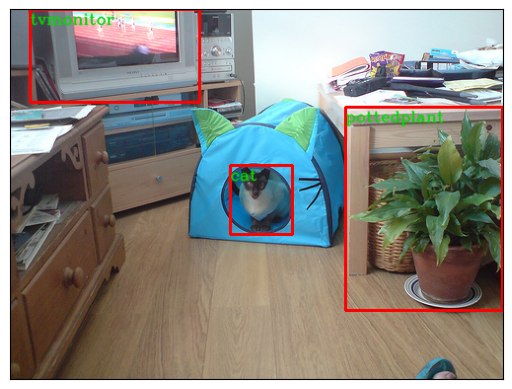

In [14]:
def show_image(df,image_id):
    """
    Displays an image with bounding boxes and labels.

    Args:
        df (pd.DataFrame): DataFrame containing image annotations.
        image_id (str): ID of the image to display.
    """
    bndbox = df[df['image_id']==image_id][['xmin','ymin','xmax','ymax']].values
    names = df[df['image_id']==image_id][['labels']].apply(lambda x: classes[x['labels']], axis = 1).values
    path = os.path.join(IMG_PATH,image_id + '.jpg')
    plot_img(path,bndbox,names)

show_image(df,'2009_000488')

Set the device to CUDA if available, otherwise use CPU, and display the chosen device


In [15]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE

device(type='cuda')

Visualize the effects of various image augmentation techniques on a sample image


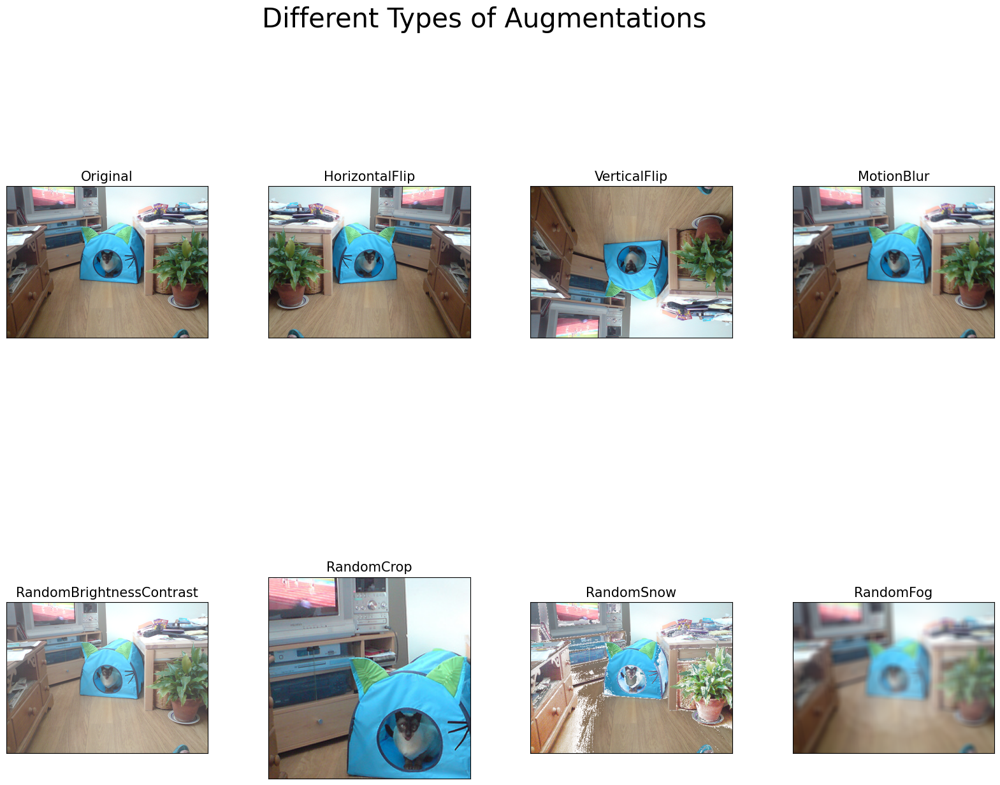

In [16]:
# Visualize various image augmentation techniques using a sample image
chosen_img = cv2.imread(os.path.join(IMG_PATH, '2009_000488.jpg'))
chosen_img = chosen_img[:, :, ::-1]  # Convert BGR to RGB

# List of augmentation methods
albumentation_list = [
    A.HorizontalFlip(p=1),
    A.VerticalFlip(p=1),
    A.MotionBlur(p=1),
    A.RandomBrightnessContrast(p=1),
    A.RandomCrop(width=224, height=224, p=1),
    A.RandomSnow(p=1),
    A.RandomFog(p=1),
]

# Titles for the augmented images
titles_list = [
    "Original",
    "HorizontalFlip",
    "VerticalFlip",
    "MotionBlur",
    "RandomBrightnessContrast",
    "RandomCrop",
    "RandomSnow",
    "RandomFog",
]

# Apply augmentations and prepare images for plotting
img_matrix_list = [chosen_img]
for aug_type in albumentation_list:
    img = aug_type(image=chosen_img)['image']
    img_matrix_list.append(img)

# Plot the original and augmented images
plot_multiple_img(img_matrix_list,
                  titles_list,
                  nrows=2,
                  ncols=4,
                  main_title="Different Types of Augmentations")

Define augmentation transformations for training and simple tensor conversion for validation


In [17]:
# Define data augmentation transformations for training and validation
def get_transform_train():
    """
    Returns a composition of augmentation transforms for training, including random flipping, motion blur,
    brightness/contrast adjustments, and snow effect, followed by conversion to tensor.

    Returns:
        A.Compose: Augmentation pipeline for training.
    """
    return A.Compose([
        A.OneOf([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
        ]),
        A.MotionBlur(p=0.2),
        A.RandomBrightnessContrast(p=0.4),
        A.RandomSnow(p=0.1),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_transform_val():
    """
    Returns a composition of transformations for validation, which includes only conversion to tensor.

    Returns:
        A.Compose: Transformation pipeline for validation.
    """
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})


Custom dataset class to load VOC images and annotations, apply transformations, and resize images if specified

In [18]:
# Custom dataset class for loading and processing VOC images and annotations
class VOCDataset(data.Dataset):
    def __init__(self, dataframe, image_dir, transforms=None, width=None, height=None):
        """
        Initialize the dataset with image directory, annotations, transformations, and optional resizing.

        Args:
            dataframe (pd.DataFrame): DataFrame containing image annotations.
            image_dir (str): Directory where images are stored.
            transforms (callable, optional): Transformations to apply to images and bounding boxes.
            width (int, optional): Width to resize images to.
            height (int, optional): Height to resize images to.
        """
        super().__init__()
        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.width = width
        self.height = height

    def __getitem__(self, index):
        """
        Retrieve an image and its annotations for a given index.

        Args:
            index (int): Index of the image to retrieve.

        Returns:
            tuple: (image, target) where image is the transformed image and target is a dictionary with bounding boxes, labels, etc.
        """
        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]

        # Load and process image
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)

        # Resize image if needed
        image_resized = image.copy()
        if self.width:
            image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        image_height, image_width = image.shape[:2]

        # Scale bounding boxes to new image size
        xmin_final = records['xmin'].values
        ymin_final = records['ymin'].values
        xmax_final = records['xmax'].values
        ymax_final = records['ymax'].values

        if self.width:
            xmin_final = (xmin_final / image_width) * self.width
            xmax_final = (xmax_final / image_width) * self.width
            ymin_final = (ymin_final / image_height) * self.height
            ymax_final = (ymax_final / image_height) * self.height

        # Convert boxes and labels to tensors
        boxes = np.column_stack((xmin_final, ymin_final, xmax_final, ymax_final))
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        labels = torch.as_tensor(records['labels'].values, dtype=torch.int64)
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)

        # Create target dictionary
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([index]),
            'area': area,
            'iscrowd': iscrowd
        }

        # Apply transformations
        if self.transforms:
            sample = self.transforms(image=image_resized, bboxes=target['boxes'], labels=labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        return image_resized, target

    def __len__(self) -> int:
        """
        Return the number of images in the dataset.

        Returns:
            int: Number of images.
        """
        return len(self.image_ids)


Load training and validation image IDs from text files and print their counts


In [19]:
# Correct paths based on the directory structure
train_txt_path = '/content/VOC_dataset/VOCdevkit/VOC2012/ImageSets/Main/train.txt'
val_txt_path = '/content/VOC_dataset/VOCdevkit/VOC2012/ImageSets/Main/val.txt'

# Get all IDs of training images
train_id_list = []
with open(train_txt_path, 'r') as file:
    for col in file:
        train_id_list.append(col.strip())

# Get all IDs of validation images
val_id_list = []
with open(val_txt_path, 'r') as file:
    for col in file:
        val_id_list.append(col.strip())

print(len(train_id_list), len(val_id_list))

5717 5823


Split the DataFrame into training and validation subsets based on image IDs


In [20]:
train_df = df[df['image_id'].isin(train_id_list)]
val_df = df[df['image_id'].isin(val_id_list)]

Define a collate function for handling variable-sized tensors, create training and validation datasets,and initialize DataLoaders with batch size, shuffling, and multiprocessing support


In [21]:
def collate_fn(batch):
    """
    Collate function to handle varying numbers of objects and different sized tensors in batches.

    Args:
        batch (list): List of tuples containing image and target data.

    Returns:
        tuple: Tuple of batched images and targets.
    """
    return tuple(zip(*batch))

# Create datasets for training and validation
train_dataset = VOCDataset(train_df, IMG_PATH, get_transform_train())
valid_dataset = VOCDataset(val_df, IMG_PATH, get_transform_val())

# Initialize DataLoader for training with batch size, shuffling, and multiprocessing
train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn
)

# Initialize DataLoader for validation with batch size and multiprocessing
valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=4,
    collate_fn=collate_fn
)

# Model

## Utility class


Display a transformed image with bounding boxes and labels to verify correctness of transformations


In [22]:
def show_transformed_image(train_loader):
    """
    Displays transformed images from the DataLoader with bounding boxes and labels to verify transformations.

    Args:
        train_loader (DataLoader): DataLoader instance providing batches of images and targets.

    Notes:
        Runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in the configuration file.
    """
    if len(train_loader) > 0:
        for i in range(1):  # Only visualize the first batch
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (255, 0, 0), 2)
                cv2.putText(sample, classes[labels[box_num]],
                        (int(box[0]), int(box[3]-5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,255),
                        2, lineType=cv2.LINE_AA)
            plt.imshow(sample)
            plt.axis('off')
            plt.show()

Visualize transformed images from the training DataLoader to verify transformations


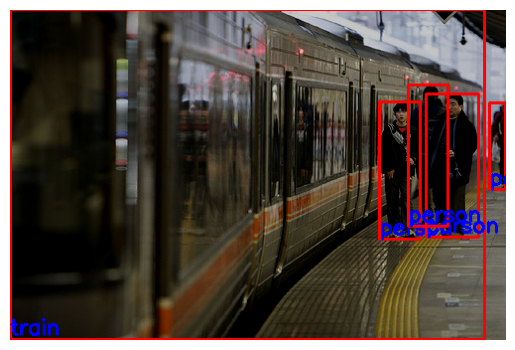

In [23]:
show_transformed_image(train_data_loader)

In [24]:
def save_model(epoch, model, optimizer):
    """
    Save the model and optimizer states to a file for the current epoch.

    Args:
        epoch (int): Current epoch number.
        model (torch.nn.Module): The model to save.
        optimizer (torch.optim.Optimizer): The optimizer to save.

    Saves:
        A checkpoint file 'last_model.pth' containing the epoch number, model state, and optimizer state.
    """
    torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

In [25]:
def save_loss_plot(train_loss, val_loss, out_dir='outputs'):
    """
    Save plots of training and validation loss to files.

    Args:
        train_loss (list): List of training loss values.
        val_loss (list): List of validation loss values.
        out_dir (str): Directory where the plots will be saved.

    Saves:
        Two PNG files: 'train_loss.png' and 'valid_loss.png' in the specified output directory.
    """
    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()
    train_ax.plot(train_loss, color='tab:blue')
    train_ax.set_xlabel('iterations')
    train_ax.set_ylabel('train loss')
    valid_ax.plot(val_loss, color='tab:red')
    valid_ax.set_xlabel('iterations')
    valid_ax.set_ylabel('validation loss')
    figure_1.savefig(f"{out_dir}/train_loss.png")
    figure_2.savefig(f"{out_dir}/valid_loss.png")
    plt.close(figure_1)
    plt.close(figure_2)
    print('SAVING PLOTS COMPLETE...')

Class to track and average training and validation loss values over iterations

In [26]:
class Averager():
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        """
        Add a new value to the current total and increment the iteration count.

        Args:
            value (float): The value to add to the total.
        """
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        """
        Compute the average value.

        Returns:
            float: The average of the values sent.
        """
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        """
        Reset the total and iteration count to zero.
        """
        self.current_total = self.iterations = 0.0


Class to track and save the model with the best validation loss encountered during training


In [27]:
class SaveBestModel:
    def __init__(self, best_valid_loss=float('inf')):
        """
        Initialize with a very high best validation loss to ensure any valid loss is considered as better.

        Args:
            best_valid_loss (float): Initial best validation loss.
        """
        self.best_valid_loss = best_valid_loss

    def __call__(self, current_valid_loss, epoch, model, optimizer):
        """
        Save the model if the current validation loss is the best encountered so far.

        Args:
            current_valid_loss (float): The current validation loss to compare.
            epoch (int): Current epoch number.
            model (torch.nn.Module): The model to save.
            optimizer (torch.optim.Optimizer): The optimizer to save.

        Saves:
            A checkpoint file 'best_model.pth' containing the epoch number, model state, and optimizer state if the current loss is the best.
        """
        if current_valid_loss < self.best_valid_loss:
            self.best_valid_loss = current_valid_loss
            print(f"\nBest validation loss: {self.best_valid_loss}")
            print(f"\nSaving best model for epoch: {epoch + 1}\n")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/best_model.pth')


## Train model

In [28]:
def create_model(num_classes):
    """
    Create a Faster R-CNN model with a custom number of classes.

    Args:
        num_classes (int): The number of classes for the detection task.

    Returns:
        torchvision.models.detection.FasterRCNN: The modified Faster R-CNN model with the specified number of classes.

    Modifies:
        The model's box predictor head to match the number of classes.
    """
    # Load a pre-trained Faster R-CNN model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # Get the number of input features for the box predictor
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # Replace the box predictor with a new one for the specific number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [29]:
def train(train_data_loader, model):
    """
    Run training iterations for the model on the provided data loader.

    Args:
        train_data_loader (DataLoader): The data loader for training data.
        model (torch.nn.Module): The model to be trained.

    Returns:
        list: A list of training loss values for each iteration.

    Modifies:
        - Updates the global `train_loss_list` with the loss values.
        - Updates the global `train_itr` count for iterations.
    """
    print('Training')
    global train_itr
    global train_loss_list

    # Initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        train_loss_list.append(loss_value)
        train_loss_hist.send(loss_value)
        losses.backward()
        optimizer.step()
        train_itr += 1

        # Update the progress bar description with the current loss value
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    return train_loss_list

In [30]:
def validate(valid_data_loader, model):
    """
    Run validation iterations for the model on the provided data loader.

    Args:
        valid_data_loader (DataLoader): The data loader for validation data.
        model (torch.nn.Module): The model to be validated.

    Returns:
        list: A list of validation loss values for each iteration.

    Modifies:
        - Updates the global `val_loss_list` with the loss values.
        - Updates the global `val_itr` count for iterations.
    """
    print('Validating')
    global val_itr
    global val_loss_list

    # Initialize tqdm progress bar
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        val_loss_list.append(loss_value)
        val_loss_hist.send(loss_value)
        val_itr += 1

        # Update the progress bar description with the current loss value
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    return val_loss_list



In [31]:
# Create and display the Faster R-CNN model with a specified number of classes (21 including background)
num_classes = 21

model = create_model(num_classes)

print(model)

# Count and print the total number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 202MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [32]:
# Move the model to the specified device (GPU or CPU)
model.to(DEVICE)

# Set up the optimizer with SGD and specify parameters to update
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

# Set up the learning rate scheduler to adjust the learning rate every 5 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

In [33]:
# Create the 'outputs' directory if it does not exist
os.makedirs('outputs', exist_ok=True)

# Initialize Averager instances for tracking training and validation losses
train_loss_hist = Averager()
val_loss_hist = Averager()

# Initialize iteration counters
train_itr = 1
val_itr = 1

# Lists to store loss values for training and validation
train_loss_list = []
val_loss_list = []

# Name for saving the trained model
MODEL_NAME = 'model'

# Initialize the SaveBestModel class to keep track of and save the best model
save_best_model = SaveBestModel()

In [34]:
from sklearn.metrics import average_precision_score

def compute_ap_per_class(true_cases, pred_scores, threshold=0.5):
    # Convert lists to arrays for logical indexing
    true_cases = np.array(true_cases)
    pred_scores = np.array(pred_scores)

    # Apply threshold to prediction scores to create binary outputs
    predictions = pred_scores >= threshold

    # Calculate average precision score
    ap = average_precision_score(true_cases, predictions)
    return ap
def calculate_map(all_predictions, all_targets, num_classes):
    aps = []
    for cls in range(num_classes):
        true_cases = [1 if any([t['labels'][i] == cls for i in range(len(t['labels']))]) else 0 for t in all_targets]
        pred_scores = [p['scores'][i] for p in all_predictions for i, label in enumerate(p['labels']) if label == cls]
        if true_cases:
            ap = compute_ap_per_class(true_cases, pred_scores)
            aps.append(ap)
    return np.mean(aps)


In [35]:
# Set the number of training epochs
NUM_EPOCHS = 1

# Run training and validation for each epoch
for epoch in range(NUM_EPOCHS):
    print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

    # Reset loss histories for the current epoch
    train_loss_hist.reset()
    val_loss_hist.reset()

    # Start timer and execute training and validation
    start = time.time()

    train_loss = train(train_data_loader, model)
    val_loss = validate(valid_data_loader, model)

    print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
    print(f"Epoch #{epoch+1} validation loss: {val_loss_hist.value:.3f}")

    end = time.time()
    print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

    # Save the best model based on the lowest validation loss
    save_best_model(val_loss_hist.value, epoch, model, optimizer)

    # Save the current epoch's model
    save_model(epoch, model, optimizer)

    # Save plots of training and validation loss
    save_loss_plot(train_loss, val_loss)




EPOCH 1 of 1
Training


  0%|          | 0/1430 [00:00<?, ?it/s]

KeyboardInterrupt: 

# Test Model

In [40]:
def load_model(model, path):
    """
    Load a model's state from a checkpoint file.

    Args:
        model (torch.nn.Module): The model to load the state into.
        path (str): Path to the checkpoint file.

    Returns:
        torch.nn.Module: The model with the loaded state.
    """
    checkpoint = torch.load(path, map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    return model

In [41]:
# load the best model and trained weights
model = create_model(num_classes=21)
path = '/content/drive/MyDrive/last_model.pth'
model = load_model(model,path)
model.to(DEVICE).eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

Define the detection threshold to discard detections with scores below this value

In [43]:
detection_threshold = 0.8

num_test = 20
test_images = []

total_fps = 0

frame_count = 0

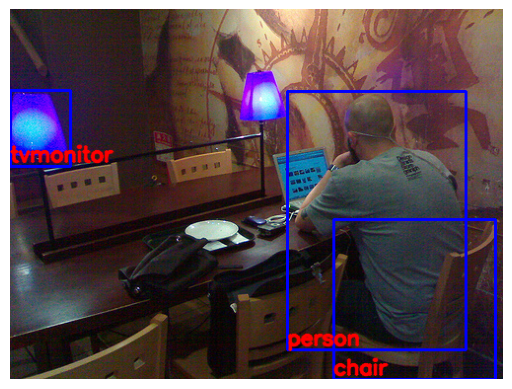

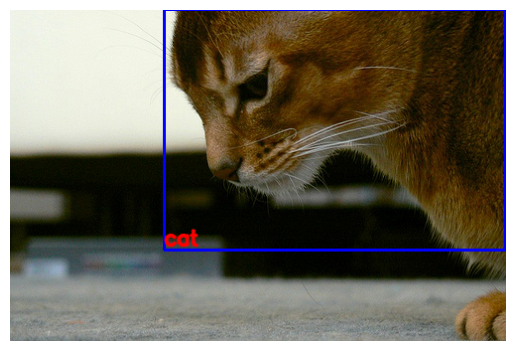

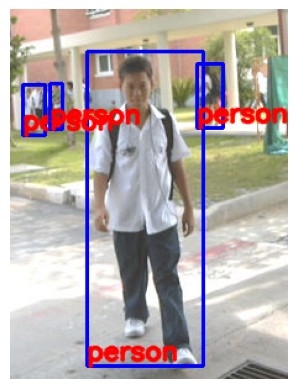

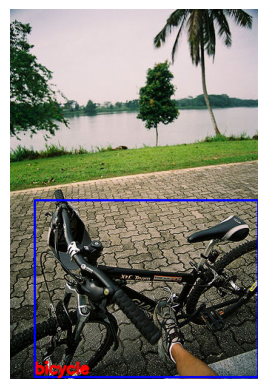

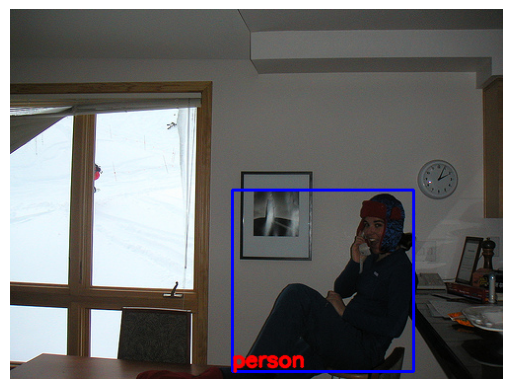

...

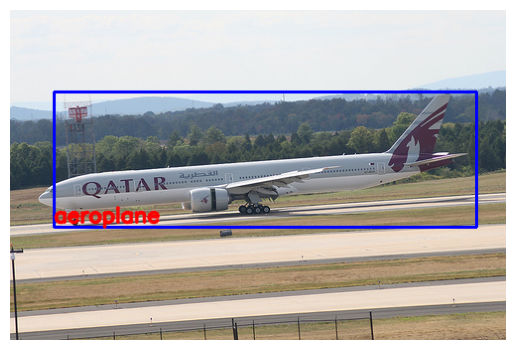

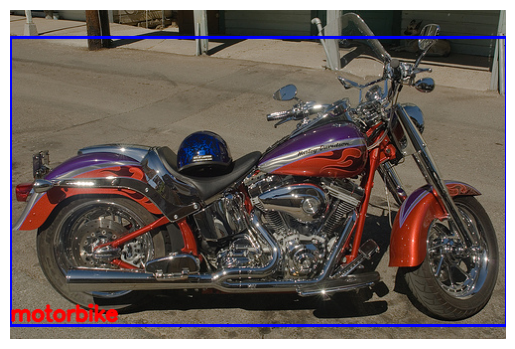

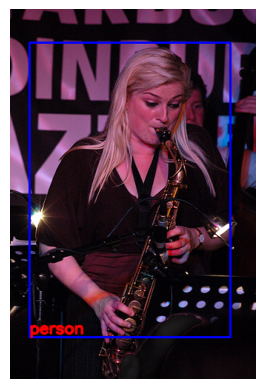

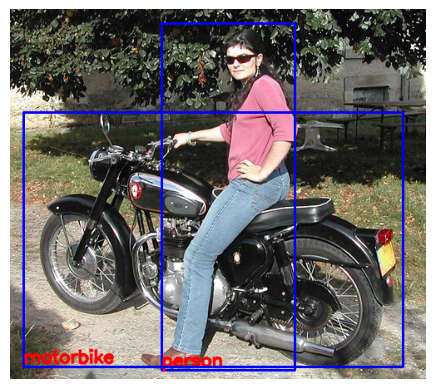

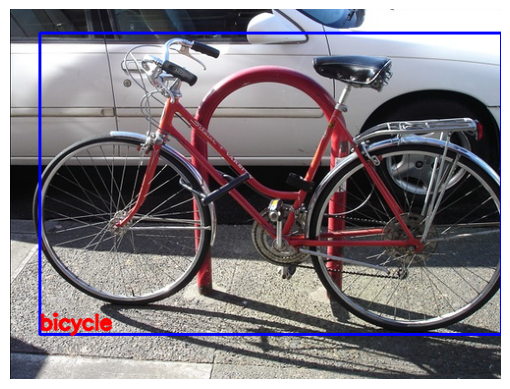

Average FPS: 18.074


In [44]:
for i in os.listdir(IMG_PATH)[:num_test]:
    # Load and prepare image
    image = cv2.imread(os.path.join(IMG_PATH, i))
    orig_image = image.copy()

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255
    image = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image = torch.tensor(image, dtype=torch.float).cuda()

    image = torch.unsqueeze(image, 0)

    # Measure inference time
    start_time = time.time()
    with torch.no_grad():
        outputs = model(image.to(DEVICE))
    end_time = time.time()

    # Update FPS metrics
    frame_count += 1
    fps = 1 / (end_time - start_time)
    total_fps += fps

    # Process detections
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        draw_boxes = boxes.copy()
        pred_classes = [classes[i] for i in outputs[0]['labels'].cpu().numpy()]

        # Draw bounding boxes and class names on the image
        for j, box in enumerate(draw_boxes):
            class_name = pred_classes[j]
            cv2.rectangle(orig_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          (255, 0, 0), 2)
            cv2.putText(orig_image, class_name,
                        (int(box[0]), int(box[3] - 5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255),
                        2, lineType=cv2.LINE_AA)

        # Display and save the image
        plt.imshow(orig_image[:, :, ::-1])
        plt.axis('off')
        plt.show()
        cv2.imwrite(f"outputs/{i}", orig_image)

# Calculate and print average FPS
avg_fps = total_fps / frame_count
print(f'Average FPS: {avg_fps:.3f}')

In [46]:
import torch
from sklearn.metrics import average_precision_score
import numpy as np
from tqdm import tqdm

def compute_ap_per_class(true_cases, pred_scores, threshold=0.5):
    """
    Compute Average Precision for a single class.

    Args:
    true_cases (list): Binary list indicating presence of object in each image
    pred_scores (list): Prediction scores for the class
    threshold (float): Threshold for considering a detection as positive

    Returns:
    float: Average Precision for the class
    """
    # Convert lists to arrays for logical indexing
    true_cases = np.array(true_cases)
    pred_scores = np.array(pred_scores)

    # Apply threshold to prediction scores to create binary outputs
    predictions = pred_scores >= threshold

    # Calculate average precision score
    ap = average_precision_score(true_cases, predictions)
    return ap

def calculate_map(all_predictions, all_targets, num_classes):
    """
    Calculate Mean Average Precision across all classes.

    Args:
    all_predictions (list): List of prediction dictionaries for each image
    all_targets (list): List of target dictionaries for each image
    num_classes (int): Number of classes in the dataset

    Returns:
    float: Mean Average Precision, dict of APs per class
    """
    aps = []
    ap_per_class = {}
    for cls in range(1, num_classes):  # Assuming class 0 is background
        true_cases = [1 if cls in t['labels'].cpu().numpy() else 0 for t in all_targets]
        pred_scores = []
        for p in all_predictions:
            if cls in p['labels'].cpu().numpy():
                pred_scores.append(max(p['scores'][p['labels'] == cls].cpu().numpy()))
            else:
                pred_scores.append(0)

        if sum(true_cases) > 0:  # Only calculate AP if the class appears in the ground truth
            ap = compute_ap_per_class(true_cases, pred_scores)
            aps.append(ap)
            ap_per_class[cls] = ap

    mAP = np.mean(aps)
    return mAP, ap_per_class

def run_inference(model, data_loader, device):
    model.eval()
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Running inference"):
            images = list(img.to(device) for img in images)
            outputs = model(images)

            # Move outputs to CPU
            cpu_outputs = [{k: v.cpu() for k, v in t.items()} for t in outputs]
            all_predictions.extend(cpu_outputs)

            # Move targets to CPU
            cpu_targets = [{k: v.cpu() for k, v in t.items()} for t in targets]
            all_targets.extend(cpu_targets)

    return all_predictions, all_targets

# Calculate mAP after training
def compute_map(model, valid_data_loader, device, num_classes):
    model.eval()
    all_predictions, all_targets = run_inference(model, valid_data_loader, device)
    mAP, ap_per_class = calculate_map(all_predictions, all_targets, num_classes)
    print(f"Mean Average Precision (mAP): {mAP:.4f}")
    for cls, ap in ap_per_class.items():
        print(f"Class {cls} Average Precision (AP): {ap:.4f}")
    return mAP, ap_per_class

# Usage
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mAP, ap_per_class = compute_map(model, valid_data_loader, DEVICE, num_classes)


Running inference: 100%|██████████| 1456/1456 [07:09<00:00,  3.39it/s]


Mean Average Precision (mAP): 0.7022
Class 1 Average Precision (AP): 0.8968
Class 2 Average Precision (AP): 0.7828
Class 3 Average Precision (AP): 0.8086
Class 4 Average Precision (AP): 0.7275
Class 5 Average Precision (AP): 0.5040
Class 6 Average Precision (AP): 0.7531
Class 7 Average Precision (AP): 0.7134
Class 8 Average Precision (AP): 0.7807
Class 9 Average Precision (AP): 0.5156
Class 10 Average Precision (AP): 0.6087
Class 11 Average Precision (AP): 0.5668
Class 12 Average Precision (AP): 0.8099
Class 13 Average Precision (AP): 0.8073
Class 14 Average Precision (AP): 0.8447
Class 15 Average Precision (AP): 0.9003
Class 16 Average Precision (AP): 0.5238
Class 17 Average Precision (AP): 0.5355
Class 18 Average Precision (AP): 0.4947
Class 19 Average Precision (AP): 0.8313
Class 20 Average Precision (AP): 0.6382
